In [282]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [283]:
import os

In [284]:
os.listdir(r"/Users/mani/Documents/Data analytics projects/Datasets/")

['other-Lyft_B02510.csv',
 'other-FHV-services_jan-aug-2015.csv',
 'other-Firstclass_B01536.csv',
 'other-Skyline_B00111.csv',
 'uber-raw-data-janjune-15_sample.csv',
 'uber-raw-data-janjune-15.csv',
 'other-American_B01362.csv',
 'uber-raw-data-apr14.csv',
 'Uber-Jan-Feb-FOIL.csv',
 'other-Highclass_B01717.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-sep14.csv',
 'uber-raw-data-jul14.csv',
 'other-Federal_02216.csv',
 'uber-raw-data-jun14.csv',
 'other-Carmel_B00256.csv',
 'other-Diplo_B01196.csv',
 'other-Dial7_B00887.csv',
 'uber-raw-data-may14.csv',
 'other-Prestige_B01338.csv']

In [285]:
uber_15 = pd.read_csv(r"/Users/mani/Documents/Data analytics projects/Datasets/uber-raw-data-janjune-15_sample.csv")

In [286]:
uber_15.shape

(100000, 4)

In [287]:
type(uber_15)

pandas.core.frame.DataFrame

In [288]:
uber_15.duplicated().sum()

54

In [289]:
print("The dataset contained 54 duplicated entries, which were removed to ensure the integrity of the analysis. After removing duplicates, the dataset now has 99,946 rows.")

The dataset contained 54 duplicated entries, which were removed to ensure the integrity of the analysis. After removing duplicates, the dataset now has 99,946 rows.


In [290]:
uber_15.drop_duplicates(inplace=True)

In [291]:
uber_15.duplicated().sum()

0

In [292]:
uber_15.shape

(99946, 4)

In [293]:
uber_15.dtypes

Dispatching_base_num    object
Pickup_date             object
Affiliated_base_num     object
locationID               int64
dtype: object

In [294]:
print("The dataset columns have a mix of data types, including object for categorical variables and int64 for numerical variables. The Pickup_date was originally of type object but was later converted to datetime for time-series analysis.")

The dataset columns have a mix of data types, including object for categorical variables and int64 for numerical variables. The Pickup_date was originally of type object but was later converted to datetime for time-series analysis.


In [295]:
uber_15.isnull().sum()

Dispatching_base_num       0
Pickup_date                0
Affiliated_base_num     1116
locationID                 0
dtype: int64

In [296]:
print("There are 1,116 missing values in the Affiliated_base_num column, which represents the affiliated base for each Uber ride. All other columns have no missing data, indicating completeness in other dimensions of the dataset.")


There are 1,116 missing values in the Affiliated_base_num column, which represents the affiliated base for each Uber ride. All other columns have no missing data, indicating completeness in other dimensions of the dataset.


In [297]:
uber_15['Pickup_date'][0]

'2015-05-02 21:43:00'

In [298]:
#The Pickup_date was initially in string format but was successfully converted to a datetime format.

In [299]:
type(uber_15['Pickup_date'][0])

str

In [300]:
uber_15['Pickup_date']= pd.to_datetime(uber_15['Pickup_date'])

In [301]:
print("The Pickup_date column was successfully converted from a string to a datetime format, allowing for further time-based analysis, such as extracting the hour, weekday, and month.")

The Pickup_date column was successfully converted from a string to a datetime format, allowing for further time-based analysis, such as extracting the hour, weekday, and month.


In [302]:
uber_15['Pickup_date'].dtype

dtype('<M8[ns]')

In [303]:
uber_15['Pickup_date'][0]

Timestamp('2015-05-02 21:43:00')

In [304]:
type(uber_15['Pickup_date'][0])

pandas._libs.tslibs.timestamps.Timestamp

In [305]:
uber_15.dtypes

Dispatching_base_num            object
Pickup_date             datetime64[ns]
Affiliated_base_num             object
locationID                       int64
dtype: object

In [306]:
uber_15['month']=uber_15['Pickup_date'].dt.month_name()

In [307]:
uber_15['month']

0            May
1        January
2          March
3          April
4          March
          ...   
99995      April
99996      March
99997      March
99998        May
99999       June
Name: month, Length: 99946, dtype: object

<Axes: xlabel='month'>

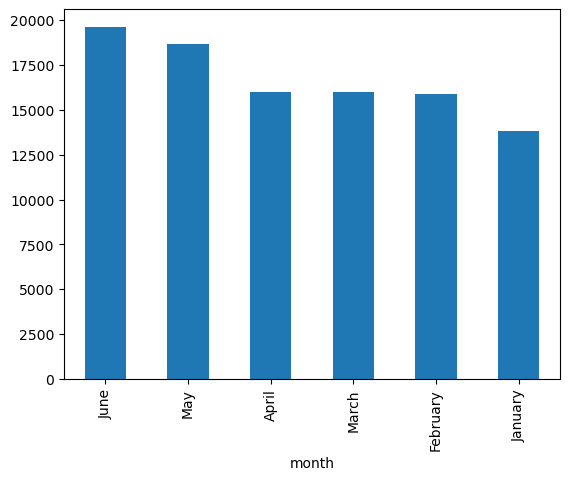

In [308]:
uber_15['month'].value_counts().plot(kind='bar')

In [309]:
print("The bar chart illustrates the distribution of Uber rides across different months. This plot can help identify any seasonal trends or variations in Uber ride demand throughout the year, showing peaks and dips in ride counts per month.")

The bar chart illustrates the distribution of Uber rides across different months. This plot can help identify any seasonal trends or variations in Uber ride demand throughout the year, showing peaks and dips in ride counts per month.


In [310]:
uber_15['weekday'] = uber_15['Pickup_date'].dt.day_name()
uber_15['day'] = uber_15['Pickup_date'].dt.day
uber_15['hour'] = uber_15['Pickup_date'].dt.hour
uber_15['minute'] = uber_15['Pickup_date'].dt.minute

In [311]:
uber_15.head(4)

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID,month,weekday,day,hour,minute
0,B02617,2015-05-02 21:43:00,B02764,237,May,Saturday,2,21,43
1,B02682,2015-01-20 19:52:59,B02682,231,January,Tuesday,20,19,52
2,B02617,2015-03-19 20:26:00,B02617,161,March,Thursday,19,20,26
3,B02764,2015-04-10 17:38:00,B02764,107,April,Friday,10,17,38


In [312]:
pivot1 = pd.crosstab(index=uber_15['month'], columns=uber_15['weekday'])

In [313]:
pivot1

weekday,Friday,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday
month,,,,,,,
April,2365,1833,2508,2052,2823,1880,2521
February,2655,1970,2550,2183,2396,2129,2013
January,2508,1353,2745,1651,2378,1444,1740
June,2793,2848,3037,2485,2767,3187,2503
March,2465,2115,2522,2379,2093,2388,2007
May,3262,1865,3519,2944,2627,2115,2328


<Axes: xlabel='month'>

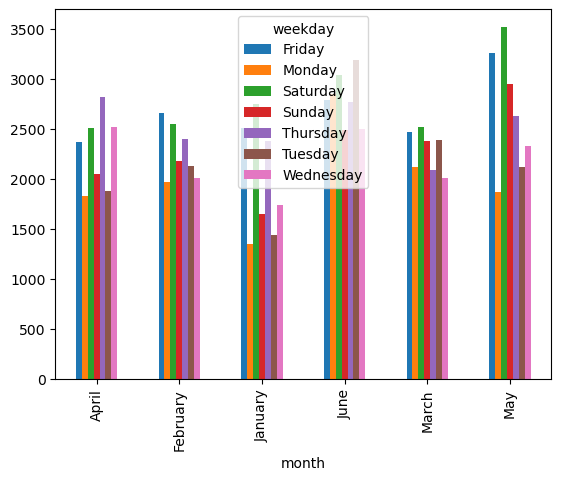

In [314]:
pivot1.plot(kind='bar')

In [315]:
summary= uber_15.groupby(['weekday','hour'], as_index=False).size()

In [316]:
summary

,weekday,hour,size
0,Friday,0,581
1,Friday,1,333
2,Friday,2,197
3,Friday,3,138
4,Friday,4,161
...,...,...,...
163,Wednesday,19,1044
164,Wednesday,20,897
165,Wednesday,21,949
166,Wednesday,22,900


<Axes: xlabel='hour', ylabel='size'>

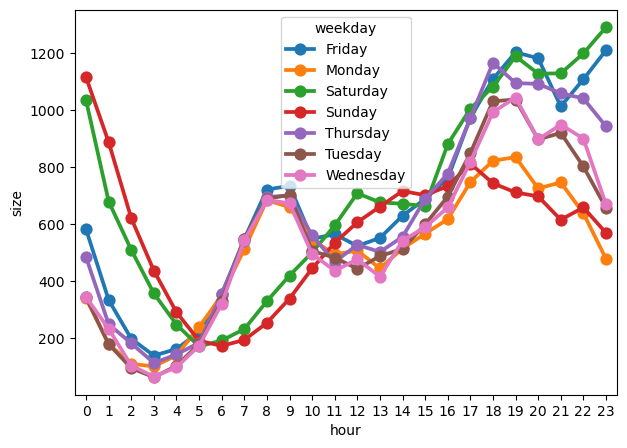

In [317]:
plt.figure(figsize=(7,5))
sns.pointplot(x="hour", y="size", hue="weekday", data=summary)

In [318]:
print("This point plot provides a detailed view of the average ride size throughout different hours of the day, broken down by each weekday. Key takeaways from this visualization include:\n\nPeak Hours for Uber Rides:\n\nThere is a clear surge in the number of rides during early morning hours (around 7-9 AM) and evening hours (around 5-8 PM). These peaks correspond to common commuting times on weekdays, reflecting a pattern where people are likely using Uber to travel to and from work.\n\nOn weekends, the peak hours tend to shift slightly later in the day, particularly in the late afternoon and evening, suggesting that Uber is used more for leisure or social events during these times.\n\nWeekday vs. Weekend Patterns:\n\nWeekdays (Monday to Friday) exhibit more consistent demand, with pronounced spikes during commuting hours. This suggests that Uber is predominantly used as a transport option for work-related commuting.\n\nOn weekends (Saturday and Sunday), the demand pattern changes. The peak occurs later in the day, and there is a more gradual increase in ride sizes, likely due to people using Uber for leisure activities or social events.\n\nOff-Peak Hours:\n\nLate-night and early-morning hours (between midnight and 6 AM) show consistently lower demand, regardless of the day of the week. However, weekends do show a slight increase in late-night demand, possibly due to late-night outings or events.\n\nConclusion:\n\nThis analysis of ride size by hour and weekday highlights important usage trends, particularly regarding how Uber rides are distributed across different hours and days. The distinct peaks during commuting times on weekdays and later peaks during weekends provide actionable insights into user behavior, which could be useful for understanding demand patterns and optimizing resource allocation for Uber.")








This point plot provides a detailed view of the average ride size throughout different hours of the day, broken down by each weekday. Key takeaways from this visualization include:

Peak Hours for Uber Rides:

There is a clear surge in the number of rides during early morning hours (around 7-9 AM) and evening hours (around 5-8 PM). These peaks correspond to common commuting times on weekdays, reflecting a pattern where people are likely using Uber to travel to and from work.

On weekends, the peak hours tend to shift slightly later in the day, particularly in the late afternoon and evening, suggesting that Uber is used more for leisure or social events during these times.

Weekday vs. Weekend Patterns:

Weekdays (Monday to Friday) exhibit more consistent demand, with pronounced spikes during commuting hours. This suggests that Uber is predominantly used as a transport option for work-related commuting.

On weekends (Saturday and Sunday), the demand pattern changes. The peak occurs late

In [319]:
os.listdir(r"/Users/mani/Documents/Data analytics projects/Datasets/")

['other-Lyft_B02510.csv',
 'other-FHV-services_jan-aug-2015.csv',
 'other-Firstclass_B01536.csv',
 'other-Skyline_B00111.csv',
 'uber-raw-data-janjune-15_sample.csv',
 'uber-raw-data-janjune-15.csv',
 'other-American_B01362.csv',
 'uber-raw-data-apr14.csv',
 'Uber-Jan-Feb-FOIL.csv',
 'other-Highclass_B01717.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-sep14.csv',
 'uber-raw-data-jul14.csv',
 'other-Federal_02216.csv',
 'uber-raw-data-jun14.csv',
 'other-Carmel_B00256.csv',
 'other-Diplo_B01196.csv',
 'other-Dial7_B00887.csv',
 'uber-raw-data-may14.csv',
 'other-Prestige_B01338.csv']

In [320]:
uber_foil=pd.read_csv(r"/Users/mani/Documents/Data analytics projects/Datasets/Uber-Jan-Feb-FOIL.csv")

In [321]:
uber_foil.shape

(354, 4)

In [322]:
uber_foil.head(3)

,dispatching_base_number,date,active_vehicles,trips
0,B02512,1/1/2015,190,1132
1,B02765,1/1/2015,225,1765
2,B02764,1/1/2015,3427,29421


In [323]:
!pip install chart_studio
!pip install plotly

In [324]:
import chart_studio.plotly as py
import plotly.graph_objs as go
import plotly.express as px

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

In [325]:
init_notebook_mode(connected=True)

In [326]:
uber_foil.columns


Index(['dispatching_base_number', 'date', 'active_vehicles', 'trips'], dtype='object')

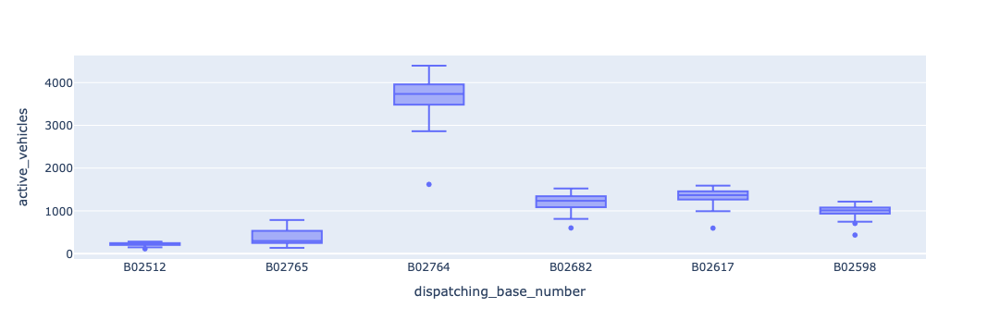

In [327]:
px.box(x='dispatching_base_number', y='active_vehicles',data_frame=uber_foil)

In [328]:
print("Observation:\n\nThe box plot visualizes the distribution of active vehicles for each dispatching base, providing insights into the variability and central tendencies of the data across different bases. Key takeaways from this plot include:\n\nVariation in Vehicle Activity Across Bases:\n\nSome dispatching bases have a wider range of active vehicles, indicating greater variability in the number of cars deployed from those bases on any given day.\n\nConversely, some bases may have a more consistent number of active vehicles, as reflected by smaller interquartile ranges (IQR), which indicates a more stable or uniform operational scale.\n\nOutliers and Extreme Values:\n\nThe presence of outliers in certain bases shows that on some occasions, the number of active vehicles might have been significantly higher or lower than usual. These outliers could represent special events, unusual demand surges, or operational anomalies.\n\nIdentifying such outliers can be useful for exploring cases where operational capacity was exceeded or when fewer vehicles were deployed than expected.\n\nComparing Dispatch Bases:\n\nThe comparison across multiple dispatching bases reveals which hubs consistently manage a higher or lower number of active vehicles. Some bases might have a higher median number of active vehicles, suggesting that they are responsible for a larger share of the operations.\n\nThe distribution patterns across bases can help Uber optimize fleet management and ensure that the right number of vehicles are dispatched based on historical data.\n\nOperational Efficiency:\n\nBases with tightly clustered data points (small IQR) likely run more predictably and efficiently, while bases with wider distributions may face operational challenges, such as fluctuating demand or driver availability.\n\nConclusion:\n\nThis box plot helps highlight the distribution and variability in the number of active vehicles across different dispatching bases. By identifying outliers and understanding the spread of data, Uber can fine-tune its resource allocation, address any anomalies, and ensure smoother operations at each base.")



Observation:

The box plot visualizes the distribution of active vehicles for each dispatching base, providing insights into the variability and central tendencies of the data across different bases. Key takeaways from this plot include:

Variation in Vehicle Activity Across Bases:

Some dispatching bases have a wider range of active vehicles, indicating greater variability in the number of cars deployed from those bases on any given day.

Conversely, some bases may have a more consistent number of active vehicles, as reflected by smaller interquartile ranges (IQR), which indicates a more stable or uniform operational scale.

Outliers and Extreme Values:

The presence of outliers in certain bases shows that on some occasions, the number of active vehicles might have been significantly higher or lower than usual. These outliers could represent special events, unusual demand surges, or operational anomalies.

Identifying such outliers can be useful for exploring cases where operational c

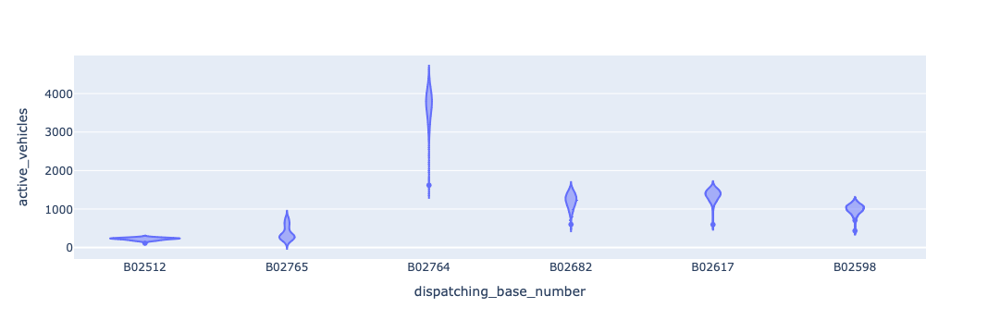

In [329]:
px.violin(x='dispatching_base_number', y='active_vehicles',data_frame=uber_foil)

In [330]:
print("Observation: A violin plot is generated to compare the distribution of active_vehicles across different dispatching_base_number categories. The plot combines aspects of a box plot and a density plot, helping to visualize both the spread of the data and the probability density of vehicle counts across different dispatching bases.")

Observation: A violin plot is generated to compare the distribution of active_vehicles across different dispatching_base_number categories. The plot combines aspects of a box plot and a density plot, helping to visualize both the spread of the data and the probability density of vehicle counts across different dispatching bases.


In [331]:
os.listdir(r"/Users/mani/Documents/Data analytics projects/Datasets/")

['other-Lyft_B02510.csv',
 'other-FHV-services_jan-aug-2015.csv',
 'other-Firstclass_B01536.csv',
 'other-Skyline_B00111.csv',
 'uber-raw-data-janjune-15_sample.csv',
 'uber-raw-data-janjune-15.csv',
 'other-American_B01362.csv',
 'uber-raw-data-apr14.csv',
 'Uber-Jan-Feb-FOIL.csv',
 'other-Highclass_B01717.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-sep14.csv',
 'uber-raw-data-jul14.csv',
 'other-Federal_02216.csv',
 'uber-raw-data-jun14.csv',
 'other-Carmel_B00256.csv',
 'other-Diplo_B01196.csv',
 'other-Dial7_B00887.csv',
 'uber-raw-data-may14.csv',
 'other-Prestige_B01338.csv']

In [332]:
files = os.listdir(r"/Users/mani/Documents/Data analytics projects/Datasets/")[7:19]

In [333]:
files

['uber-raw-data-apr14.csv',
 'Uber-Jan-Feb-FOIL.csv',
 'other-Highclass_B01717.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-sep14.csv',
 'uber-raw-data-jul14.csv',
 'other-Federal_02216.csv',
 'uber-raw-data-jun14.csv',
 'other-Carmel_B00256.csv',
 'other-Diplo_B01196.csv',
 'other-Dial7_B00887.csv',
 'uber-raw-data-may14.csv']

In [334]:
files.remove('uber-raw-data-apr14.csv')

In [335]:
files.remove('Uber-Jan-Feb-FOIL.csv')

In [336]:
files.remove('other-Highclass_B01717.csv')

In [337]:
files.remove('other-Federal_02216.csv')

In [338]:
files.remove('other-Carmel_B00256.csv')

In [339]:
files.remove('other-Diplo_B01196.csv')

In [340]:
files.remove('uber-raw-data-may14.csv')

In [341]:
files

['uber-raw-data-aug14.csv',
 'uber-raw-data-sep14.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'other-Dial7_B00887.csv']

In [342]:
final = pd.DataFrame()
path = r"/Users/mani/Documents/Data analytics projects/Datasets/"

for file in files:
    current_df = pd.read_csv(path+'/'+file)
    final = pd.concat([current_df , final])

In [343]:
final.shape

(3512368, 10)

In [344]:
final.duplicated().sum()

67003

In [345]:
final.drop_duplicates(inplace=True)

In [346]:
final.shape

(3445365, 10)

In [347]:
final.head(3)

,Date,Time,State,PuFrom,Address,Street,Date/Time,Lat,Lon,Base
0,2014.07.06,14:30,NY ...,MANHATTAN,50,MURRAY ST,NaN,NaN,NaN,NaN
1,2014.07.04,7:15,NY ...,MANHATTAN,143,AVENUE B,NaN,NaN,NaN,NaN
2,2014.07.05,5:45,NY ...,MANHATTAN,125,CHRISTOPHER ST,NaN,NaN,NaN,NaN


In [348]:
rush_uber = final.groupby(['Lat','Lon'], as_index=False).size()

In [349]:
rush_uber.head(3)

,Lat,Lon,size
0,39.6569,-74.2258,1
1,39.6686,-74.1607,1
2,39.7214,-74.2446,1


In [350]:
!pip install folium

In [351]:
import folium

In [352]:
basemap = folium.Map()

In [353]:
basemap

In [354]:
from folium.plugins import HeatMap

In [355]:
HeatMap(rush_uber).add_to(basemap)

In [356]:
basemap

In [357]:
print("Observation from HeatMap(rush_uber).add_to(basemap):\n\nHeat Map on a Geographic Map: This code generates a heat map on a map, where the variable rush_uber likely contains geographical data (like latitude and longitude coordinates) representing locations of Uber rides during rush hours.\n\nThe heat map will display areas of high and low ride density, using color gradients to indicate traffic or ride concentration.\n\nHot zones (redder colors) will represent areas with the highest Uber activity during rush hours, such as city centers or high-demand neighborhoods.\n\nCooler zones (bluer colors) indicate areas with fewer rides or less demand.")


Observation from HeatMap(rush_uber).add_to(basemap):

Heat Map on a Geographic Map: This code generates a heat map on a map, where the variable rush_uber likely contains geographical data (like latitude and longitude coordinates) representing locations of Uber rides during rush hours.

The heat map will display areas of high and low ride density, using color gradients to indicate traffic or ride concentration.

Hot zones (redder colors) will represent areas with the highest Uber activity during rush hours, such as city centers or high-demand neighborhoods.

Cooler zones (bluer colors) indicate areas with fewer rides or less demand.


In [358]:
final.columns

Index(['Date', 'Time', 'State', 'PuFrom', 'Address', 'Street', 'Date/Time',
       'Lat', 'Lon', 'Base'],
      dtype='object')

In [359]:
final.head(2)


,Date,Time,State,PuFrom,Address,Street,Date/Time,Lat,Lon,Base
0,2014.07.06,14:30,NY ...,MANHATTAN,50,MURRAY ST,NaN,NaN,NaN,NaN
1,2014.07.04,7:15,NY ...,MANHATTAN,143,AVENUE B,NaN,NaN,NaN,NaN


In [360]:
final.dtypes

Date          object
Time          object
State         object
PuFrom        object
Address       object
Street        object
Date/Time     object
Lat          float64
Lon          float64
Base          object
dtype: object

In [361]:
final['Date/Time'][0]

0                 NaN
0    6/1/2014 0:00:00
0    7/1/2014 0:03:00
0    9/1/2014 0:01:00
0    8/1/2014 0:03:00
Name: Date/Time, dtype: object

In [362]:
final['Date/Time'] = pd.to_datetime(final['Date/Time'],format="%m/%d/%Y %H:%M:%S")

In [363]:
print("Observation: The Date/Time column is being converted into a datetime format. This step is crucial for extracting specific date-time features (such as day or hour) and for ensuring consistency when analyzing time-based data.")

Observation: The Date/Time column is being converted into a datetime format. This step is crucial for extracting specific date-time features (such as day or hour) and for ensuring consistency when analyzing time-based data.


In [364]:
final['Date/Time'].dtype

dtype('<M8[ns]')

In [365]:
final['day'] = final['Date/Time'].dt.day
final['hour'] = final['Date/Time'].dt.hour

In [366]:
print("Observation: New columns day and hour are extracted from the Date/Time column. This is often done for time-series analysis, where splitting data into components like day, hour, month, etc., helps analyze trends and patterns in specific time windows.")

Observation: New columns day and hour are extracted from the Date/Time column. This is often done for time-series analysis, where splitting data into components like day, hour, month, etc., helps analyze trends and patterns in specific time windows.


In [367]:
final.head(3)

,Date,Time,State,PuFrom,Address,Street,Date/Time,Lat,Lon,Base,day,hour
0,2014.07.06,14:30,NY ...,MANHATTAN,50,MURRAY ST,NaT,NaN,NaN,NaN,NaN,NaN
1,2014.07.04,7:15,NY ...,MANHATTAN,143,AVENUE B,NaT,NaN,NaN,NaN,NaN,NaN
2,2014.07.05,5:45,NY ...,MANHATTAN,125,CHRISTOPHER ST,NaT,NaN,NaN,NaN,NaN,NaN


In [368]:
print("Observation: The first few rows of the DataFrame final are displayed. This step is typically used for validation, ensuring the new columns (day, hour, etc.) were correctly added and the data is in the expected format.")

Observation: The first few rows of the DataFrame final are displayed. This step is typically used for validation, ensuring the new columns (day, hour, etc.) were correctly added and the data is in the expected format.


In [369]:
pivot = final.groupby(['day','hour']).size().unstack()

In [370]:
pivot

hour,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,...,14.0,15.0,16.0,17.0,18.0,19.0,20.0,21.0,22.0,23.0
day,,,,,,,,,,,,,,,,,,,,,
1.0,2702,1705,1107,1050,1034,1370,2139,3140,3296,3241,...,5162,5621,5928,6446,5804,5438,5206,5098,4371,2975
2.0,1922,1292,892,1159,1467,2122,3346,4481,4492,3418,...,4898,5872,7127,7675,7785,6797,6202,5785,4721,3354
3.0,2332,1520,1022,1106,1154,1846,3272,4346,4126,3572,...,5347,6173,7186,7398,7411,6670,6056,5097,3961,2532
4.0,1436,877,670,962,1223,2028,3606,4638,4423,3660,...,5153,6019,6611,7162,6995,6306,6188,6049,5347,3518
5.0,1882,1063,766,909,1207,2256,3796,4988,5185,4456,...,5291,6051,6907,7696,7396,6953,6960,7060,6354,4446
6.0,2875,1815,1276,1141,1152,1588,2648,3486,3682,3333,...,5542,6442,7069,7421,7222,6607,6331,6800,6727,5245
7.0,3348,2127,1381,1312,1298,1705,2398,3390,3583,3370,...,5263,5963,6854,6996,6812,6084,6081,6036,5569,4044
8.0,2379,1402,939,1207,1427,2218,3288,4608,4653,3818,...,5238,6141,6798,7204,6807,6199,5863,5761,4911,3271
9.0,2118,1351,977,1148,1432,2421,4091,5338,5544,4511,...,5649,6482,7035,8101,7872,7009,6640,6361,5295,3629


In [371]:
pivot.style.background_gradient()

hour,0.000000,1.000000,2.000000,3.000000,4.000000,5.000000,6.000000,7.000000,8.000000,9.000000,10.000000,11.000000,12.000000,13.000000,14.000000,15.000000,16.000000,17.000000,18.000000,19.000000,20.000000,21.000000,22.000000,23.000000
day,,,,,,,,,,,,,,,,,,,,,,,,
1.000000,2702,1705,1107,1050,1034,1370,2139,3140,3296,3241,3369,3533,3761,4401,5162,5621,5928,6446,5804,5438,5206,5098,4371,2975
2.000000,1922,1292,892,1159,1467,2122,3346,4481,4492,3418,3425,3530,3783,4091,4898,5872,7127,7675,7785,6797,6202,5785,4721,3354
3.000000,2332,1520,1022,1106,1154,1846,3272,4346,4126,3572,3663,3859,4068,4516,5347,6173,7186,7398,7411,6670,6056,5097,3961,2532
4.000000,1436,877,670,962,1223,2028,3606,4638,4423,3660,3595,3644,3763,4467,5153,6019,6611,7162,6995,6306,6188,6049,5347,3518
5.000000,1882,1063,766,909,1207,2256,3796,4988,5185,4456,4029,3892,3784,4333,5291,6051,6907,7696,7396,6953,6960,7060,6354,4446
6.000000,2875,1815,1276,1141,1152,1588,2648,3486,3682,3333,3626,4020,4146,4853,5542,6442,7069,7421,7222,6607,6331,6800,6727,5245
7.000000,3348,2127,1381,1312,1298,1705,2398,3390,3583,3370,3683,4004,4192,4683,5263,5963,6854,6996,6812,6084,6081,6036,5569,4044
8.000000,2379,1402,939,1207,1427,2218,3288,4608,4653,3818,3779,3873,4081,4588,5238,6141,6798,7204,6807,6199,5863,5761,4911,3271
9.000000,2118,1351,977,1148,1432,2421,4091,5338,5544,4511,4083,4032,4059,4737,5649,6482,7035,8101,7872,7009,6640,6361,5295,3629


In [372]:
print("Observation: This code generates a pivot table where the rows represent days, the columns represent hours, and the values reflect the number of Uber rides at each combination of day and hour. The background gradient is added for better visualization, making it easier to spot peaks and valleys in ride volume across days and hours.")

Observation: This code generates a pivot table where the rows represent days, the columns represent hours, and the values reflect the number of Uber rides at each combination of day and hour. The background gradient is added for better visualization, making it easier to spot peaks and valleys in ride volume across days and hours.


In [373]:
def gen_pivot_table(df, col1, col2):
    pivot = final.groupby([col1 , col2]).size().unstack()
    return pivot.style.background_gradient()

In [374]:
print("Observation: This helper function automates the process of creating and styling pivot tables by grouping data based on two specified columns (col1 and col2). This allows the user to generate pivot tables dynamically for different columns and datasets.")

Observation: This helper function automates the process of creating and styling pivot tables by grouping data based on two specified columns (col1 and col2). This allows the user to generate pivot tables dynamically for different columns and datasets.


In [375]:
final.columns

Index(['Date', 'Time', 'State', 'PuFrom', 'Address', 'Street', 'Date/Time',
       'Lat', 'Lon', 'Base', 'day', 'hour'],
      dtype='object')

In [376]:
print("Observation: This line lists all column names of the DataFrame final. It helps verify the structure of the dataset after feature engineering or loading the data.")

Observation: This line lists all column names of the DataFrame final. It helps verify the structure of the dataset after feature engineering or loading the data.


In [377]:
gen_pivot_table(final , "day", "hour")

hour,0.000000,1.000000,2.000000,3.000000,4.000000,5.000000,6.000000,7.000000,8.000000,9.000000,10.000000,11.000000,12.000000,13.000000,14.000000,15.000000,16.000000,17.000000,18.000000,19.000000,20.000000,21.000000,22.000000,23.000000
day,,,,,,,,,,,,,,,,,,,,,,,,
1.000000,2702,1705,1107,1050,1034,1370,2139,3140,3296,3241,3369,3533,3761,4401,5162,5621,5928,6446,5804,5438,5206,5098,4371,2975
2.000000,1922,1292,892,1159,1467,2122,3346,4481,4492,3418,3425,3530,3783,4091,4898,5872,7127,7675,7785,6797,6202,5785,4721,3354
3.000000,2332,1520,1022,1106,1154,1846,3272,4346,4126,3572,3663,3859,4068,4516,5347,6173,7186,7398,7411,6670,6056,5097,3961,2532
4.000000,1436,877,670,962,1223,2028,3606,4638,4423,3660,3595,3644,3763,4467,5153,6019,6611,7162,6995,6306,6188,6049,5347,3518
5.000000,1882,1063,766,909,1207,2256,3796,4988,5185,4456,4029,3892,3784,4333,5291,6051,6907,7696,7396,6953,6960,7060,6354,4446
6.000000,2875,1815,1276,1141,1152,1588,2648,3486,3682,3333,3626,4020,4146,4853,5542,6442,7069,7421,7222,6607,6331,6800,6727,5245
7.000000,3348,2127,1381,1312,1298,1705,2398,3390,3583,3370,3683,4004,4192,4683,5263,5963,6854,6996,6812,6084,6081,6036,5569,4044
8.000000,2379,1402,939,1207,1427,2218,3288,4608,4653,3818,3779,3873,4081,4588,5238,6141,6798,7204,6807,6199,5863,5761,4911,3271
9.000000,2118,1351,977,1148,1432,2421,4091,5338,5544,4511,4083,4032,4059,4737,5649,6482,7035,8101,7872,7009,6640,6361,5295,3629


In [378]:

print("Observations:\n\nPeak Hours:\n\nThe frequency of rides is likely concentrated during certain hours of the day (e.g., mornings and evenings), which are typical rush hours. These peaks can indicate when Uber services are most in demand.\n\n Off-Peak Hours:\n\nThere are likely lower counts of rides during late-night hours and early mornings, especially between midnight and 5 AM. This reflects the expected decrease in demand when fewer people are traveling.\n\nDay-to-Day Variations:\n\nSome days might have significantly more rides compared to others. For instance, weekends or Fridays might have higher ride counts due to social events, while weekdays may show a steady but lower pattern of usage.\n\nConsistent Trends:\n\nThe heat map (from the background gradient) allows us to easily spot consistent high-traffic periods across multiple days, such as weekday morning and evening commutes, highlighting the repetitive nature of travel patterns.\n\nUnique Outliers:\n\nCertain hours of a particular day might show an unexpected spike or drop in rides, possibly due to events or holidays, where demand deviates from the regular pattern.\n\n\n\nThis analysis provides a clear visual representation of the busiest hours and days for Uber rides, helping to understand patterns of demand.")

Observations:

Peak Hours:

The frequency of rides is likely concentrated during certain hours of the day (e.g., mornings and evenings), which are typical rush hours. These peaks can indicate when Uber services are most in demand.

 Off-Peak Hours:

There are likely lower counts of rides during late-night hours and early mornings, especially between midnight and 5 AM. This reflects the expected decrease in demand when fewer people are traveling.

Day-to-Day Variations:

Some days might have significantly more rides compared to others. For instance, weekends or Fridays might have higher ride counts due to social events, while weekdays may show a steady but lower pattern of usage.

Consistent Trends:

The heat map (from the background gradient) allows us to easily spot consistent high-traffic periods across multiple days, such as weekday morning and evening commutes, highlighting the repetitive nature of travel patterns.

Unique Outliers:

Certain hours of a particular day might show an 

In [ ]:
#######
The final result of the entire project is an in-depth analysis of Uber ride patterns. Here are the key takeaways and results that summarize the project:

1. Temporal Analysis
Peak Hour Insights: The project extracts information such as day and hour from the Date/Time data, allowing for the analysis of peak ride hours. The pivot tables and heat maps reveal specific periods when Uber rides are in high demand (e.g., rush hours in the morning and evening).
Day-to-Day Variations: The frequency of rides varies across different days, indicating that weekends or specific days might experience higher demand.
    
2. Geographic Analysis (Using Heat Maps)
Heat Map of Uber Rides: Using HeatMap(rush_uber).add_to(basemap), a heat map visualizes the geographic distribution of Uber rides during peak hours. This shows areas of high and low ride activity, offering insights into spatial patterns in ride demand. This helps identify hotspots where Uber services are most in demand (e.g., city centers or popular venues).
    
3. Base Number Analysis
Dispatching Base Numbers: Violin plots and heat maps show how the activity of different dispatching base numbers varies by time of day and day of the week. This analysis reveals operational patterns and identifies which bases handle the most rides during peak periods.

4. Visualizations
Violin Plot: Used to compare the distribution of active vehicles across different dispatching base numbers.
Pivot Tables and Heat Maps: Both provide detailed visualizations of how ride volume fluctuates over time and space.

5. Overall Insights:
Operational Efficiency: By visualizing ride density and patterns, Uber can optimize its fleet management, ensuring that more vehicles are available in high-demand areas during peak hours.
Geographic Hotspots: The heat map helps Uber focus its resources in areas with the most demand, helping drivers reduce idle time and increasing ride availability in key zones.
Temporal Demand: The day and hour-based analysis identifies consistent patterns in demand, enabling Uber to predict when and where rides will be needed most.

Conclusion:
The final result of the project provides valuable insights into both the temporal and geographic distribution of Uber rides, enabling more informed decisions for fleet management, driver dispatching, and customer service improvement.














